In [1]:
# basic python packages
import numpy as np
import pandas as pd
import os
import sys 

# plotting
from matplotlib import pyplot as plt 
import seaborn as sns 
import scipy.stats as stats

# singlecell packages
import scanpy as sc
import anndata
import scrublet
import harmonypy as hm

# other single cell packages
import muon as mu # multi-modal anndatas
import celltypist # automated label predictions
import scirpy # immune cell repertoire analysis

#sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')

/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# load BigSur
bigsur_dir = '/home/groups/singlecell/smorabito/bin/BigSur/'
sys.path.append(bigsur_dir) 

from BigSur.feature_selection import mcfano_feature_selection as mcfano

In [3]:
# helper func
def append_percent_expressed(adata, marker_genes_df, group_key, expression_thresh):
    """
    Append percentage of cells expressing each gene in the cluster of interest
    (pct_in_group) and in all other clusters (pct_out_group) to the marker gene DataFrame.

    Parameters:
    - adata: AnnData object.
    - marker_genes_df: DataFrame of marker genes generated by sc.tl.rank_genes_groups.
    - group_key: Column in adata.obs containing cluster annotations (e.g., 'leiden').

    Returns:
    - Updated marker gene DataFrame with pct_in_group and pct_out_group columns.
    """
    # Binary matrix indicating whether each gene is expressed in each cell
    binary_matrix = adata.X > expression_thresh  # Adjust if data is log-transformed or sparse
    
    # Initialize new columns
    pct_in_group_list = []
    pct_out_group_list = []

    # Iterate over each cluster in the marker gene DataFrame
    unique_clusters = marker_genes_df["group"].unique()
    for cluster in unique_clusters:
        print(cluster)
        # Create a mask for the cluster of interest
        cluster_mask = adata.obs[group_key] == cluster

        # Calculate percentages
        pct_in_group = np.asarray(binary_matrix[cluster_mask, :].mean(axis=0)).flatten() * 100
        pct_out_group = np.asarray(binary_matrix[~cluster_mask, :].mean(axis=0)).flatten() * 100

        # Map percentages back to marker genes
        for gene in marker_genes_df[marker_genes_df["group"] == cluster]["names"]:
            gene_idx = adata.var_names.get_loc(gene)
            pct_in_group_list.append(pct_in_group[gene_idx])
            pct_out_group_list.append(pct_out_group[gene_idx])

    # Add the calculated percentages to the DataFrame
    marker_genes_df["pct_in_group"] = pct_in_group_list
    marker_genes_df["pct_out_group"] = pct_out_group_list

    return marker_genes_df



In [4]:
# set the project directory 
os.chdir('/home/groups/singlecell/smorabito/analysis/SERPENTINE/')
data_dir = '/home/groups/singlecell/smorabito/analysis/SERPENTINE/data/'
fig_dir = 'figures/'

In [6]:
# load the SERPENTINE dataset 
adata_met = sc.read_h5ad('{}SERPENTINE_PCA_27-11-24_annotated.h5ad'.format(data_dir))

In [7]:
# load the Chen et al dataset
adata_pri = sc.read_h5ad('{}Chen2024_Tumor_processed_201124.h5ad'.format(data_dir))

In [9]:
# save a teeny tiny dataset just for testing:

clusters_keep = ['8']
adata_tiny = adata[adata.obs.leiden.isin(clusters_keep)].copy()

adata_tiny.write_h5ad('data/tiny_adata.h5ad')

adata_tiny.shape


(16901, 23445)

In [14]:
adata_pri.shape

(279886, 36027)

In [31]:
adata_pri.obs.Treatment.unique()

['I', 'II', 'III', 'IV']
Categories (4, object): ['I', 'II', 'III', 'IV']

In [37]:
adata_pri.obs.MajorCellType.unique()

['Epi', 'Stromal', 'T', 'B', 'Mye', 'ILC']
Categories (6, object): ['B', 'Epi', 'ILC', 'Mye', 'Stromal', 'T']

/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


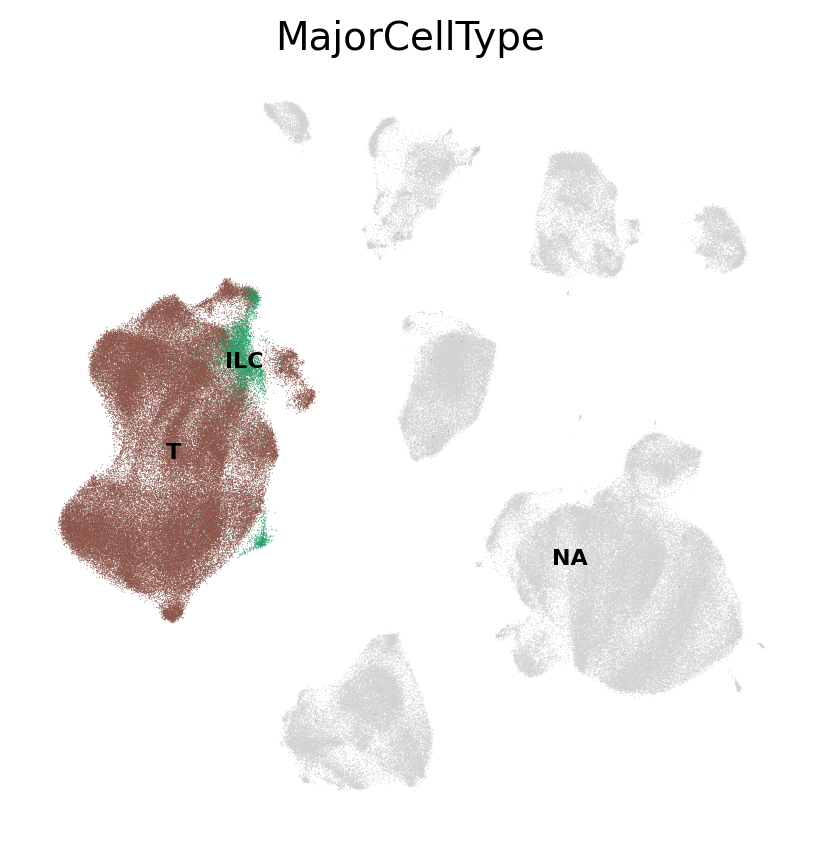

In [39]:
sc.settings.set_figure_params(dpi=100, dpi_save=500, figsize=(5,5), facecolor='white')

sc.pl.umap(
    adata_pri,
    color = ["MajorCellType"],
    groups = ["ILC", "T"],
    legend_loc='on data', 
    legend_fontsize=8, 
    frameon = False
)

/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


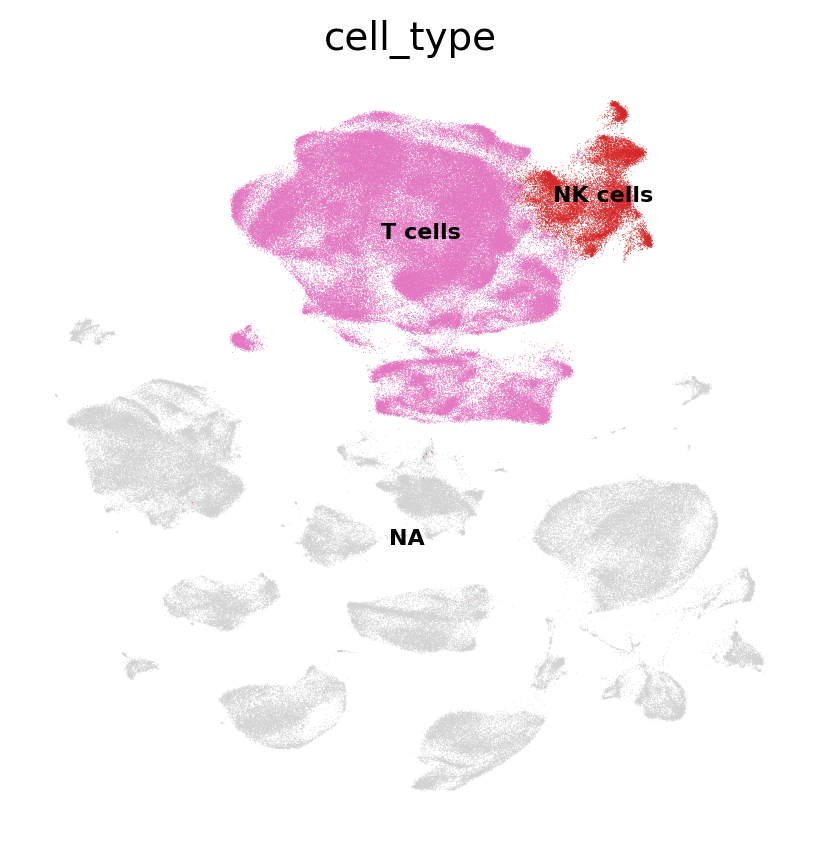

In [40]:
sc.settings.set_figure_params(dpi=100, dpi_save=500, figsize=(5,5), facecolor='white')

sc.pl.umap(
    adata_met,
    color = ["cell_type"],
    groups = ["NK cells", "T cells"],
    legend_loc='on data', 
    legend_fontsize=8, 
    frameon = False
)

## align the meta-data for the two 

Will need to do this more carefully later but just to test the integration I will only use the most necessary columns

* Patient
* Timepoint (Need to standardize these?) OMG I didn't add this yet, what is wrong w/ me
* MSS / MSI status

In [9]:
# rename columns in the primary tumor dataset:
new_cols = {
    'Ident' : 'Replicate',
    'MajorCellType': 'cell_type',
    'SubCellType' : 'annotation'
}

adata_pri.obs = adata_pri.obs.rename(columns=new_cols)


In [10]:
# add dataset columns:
adata_met.obs['dataset'] = 'SERPENTINE'
adata_pri.obs['dataset'] = 'Chen2024'

In [11]:
# common columns:
columns_keep = list(set(adata_pri.obs.columns.to_list()) & set(adata_met.obs.columns.to_list()))
columns_keep = adata_met.obs.columns[adata_met.obs.columns.isin(columns_keep)].to_list()

In [12]:
# subset metadata by common columns:
adata_pri.obs = adata_pri.obs[columns_keep]
adata_met.obs = adata_met.obs[columns_keep]

In [13]:
cur_name = 'Tcells'

# subset by celltype of interest 
adata_pri = adata_pri[adata_pri.obs.cell_type.isin(['T', 'ILC'])].copy()
adata_met = adata_met[adata_met.obs.cell_type.isin(['T cells', 'NK cells'])].copy()

In [ ]:

# # add the original annotations (from Gerard for SERPENTINE, and from 


# adata_met.obs['bc'] = [x.split('-')[0] for x in adata_met.obs.index.to_list()]

# anno_df = pd.read_table('{}/SP_annotations.csv'.format(data_dir), sep=',')
# anno_df = anno_df.rename({'Unnamed: 0': 'barcode'}, axis=1)

# anno_df['bc'] = [x.split('_')[-1] for x in anno_df.barcode.to_list()]
# anno_df['bc_sample'] = anno_df['sample'].astype(str) + '-' + anno_df.bc.astype(str)

# anno_df.head()

# adata_met.obs['bc_sample'] = adata_met.obs.Replicate.astype(str) + '-' + adata_met.obs.bc.astype(str)

# # merge with anndata obs
# temp = adata_met.obs.merge(anno_df, how='left', on = 'bc_sample')
# temp.head()

# adata_met.obs['annotation'] = temp['Annotation_2.0'].to_list()


In [ ]:

# # merge
# adata2 = adata_pri.concatenate(adata_met) 

# tmp = adata2[adata.obs.index].obs
# adata.obs['orig_annotation'] = tmp.annotation

# adata.obs.head()

## Run feature selection separately for each 

In [14]:
# fix the gene ids before merging
adata_met.var.gene_ids = adata_met.var.index.to_list()

In [12]:
# remove genes with very few counts
sc.pp.filter_genes(adata_pri, min_cells=3)
sc.pp.filter_genes(adata_met, min_cells=3)


In [ ]:
mcfano(adata_pri, layer='counts')

Using 0.05 for pvalue cutoff and 0.9 for mcfano quantile cutoff for highly variable genes.
After fitting, cv = 0.55


In [ ]:
mcfano(adata_met, layer='counts')

In [91]:
# list of genes that are variable from mcfano in both datasets 

variable_genes = list(
    set(adata_met.var.index[adata_met.var['highly_variable'] == True].to_list()) &
    set(adata_pri.var.index[adata_pri.var['highly_variable'] == True].to_list())
)

# exclude MT genes 
mt_genes = adata_met.var.gene_ids[adata_met.var.mt].to_list()
variable_genes = [x for x in variable_genes if x not in mt_genes]
len(variable_genes)


869

## merge anndata objects

In [16]:
# merge
adata = adata_pri.concatenate(adata_met) 
adata.shape

(298073, 36017)

In [18]:
# re-load the data
adata.write_h5ad('{}Integrated_{}_unprocessed.h5ad'.format(data_dir, cur_name))


... storing 'dataset' as categorical


In [109]:
# set variable features
adata.var['highly_variable'] = adata.var.gene_ids.isin(variable_genes)

## Additional QC

In [110]:
adata = adata[adata.obs.pct_counts_mt <= 10].copy()
adata.shape

(295748, 23445)

## Clustering

In [111]:
# reset the X to the log-normalized counts
adata.X = adata.layers['counts'].copy()

In [112]:
# remove genes with very few counts:
sc.pp.filter_genes(adata, min_cells=3)
adata.shape

(295748, 23445)

In [113]:
# normalize
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [114]:
sc.tl.pca(adata)

In [115]:
sc.external.pp.harmony_integrate(adata, key = ['Replicate'])

2024-12-03 13:05:17,673 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
2024-12-03 13:06:24,371 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2024-12-03 13:06:26,662 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2024-12-03 13:09:04,751 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2024-12-03 13:11:36,933 - harmonypy - INFO - Iteration 3 of 10
Iteration 3 of 10
2024-12-03 13:16:18,323 - harmonypy - INFO - Converged after 4 iterations
Converged after 4 iterations


In [116]:
# neighbors
sc.pp.neighbors(
    adata, use_rep = 'X_pca_harmony', 
    n_neighbors=20, n_pcs=20, metric='cosine'
)

sc.tl.umap(adata, min_dist=0.35, method='umap')
adata.obsm['X_umap_harmony'] = adata.obsm['X_umap'].copy()


In [ ]:

# clustering
res_list = [1, 1.5]
for res in res_list:
    print(res)
    sc.tl.leiden(adata, resolution=res)
    adata.obs["leiden_{}".format(str(res))] = adata.obs.leiden.to_list()



1


In [7]:

# clustering
res_list = [0.5, 2]
for res in res_list:
    print(res)
    sc.tl.leiden(adata, resolution=res)
    adata.obs["leiden_{}".format(str(res))] = adata.obs.leiden.to_list()



0.5
2


/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


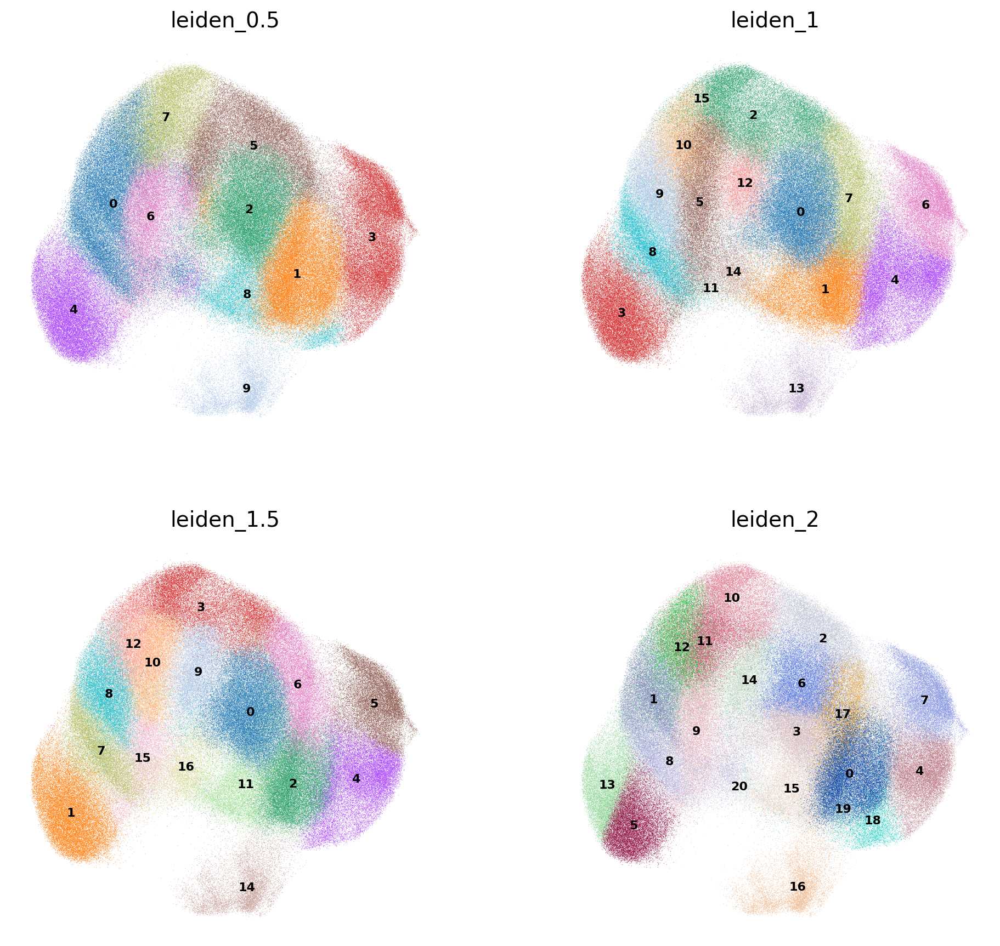

In [11]:
sc.settings.set_figure_params(dpi=100, dpi_save=500, figsize=(5,5), facecolor='white')

sc.pl.embedding(
    adata,
    basis = 'X_umap_harmony',
    color = ['leiden_0.5', 'leiden_1', 'leiden_1.5', 'leiden_2'],
    legend_loc='on data', 
    legend_fontsize=8, 
    frameon = False,
    ncols=2
)

/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


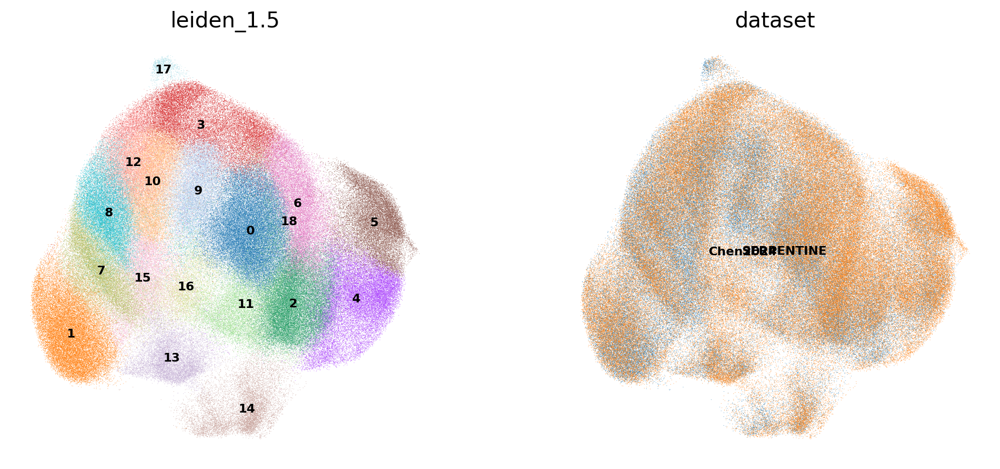

In [121]:
sc.settings.set_figure_params(dpi=100, dpi_save=500, figsize=(5,5), facecolor='white')

sc.pl.embedding(
    adata,
    basis = 'X_umap_harmony',
    color = ['leiden_1.5', 'dataset'],
    legend_loc='on data', 
    legend_fontsize=8, 
    frameon = False,
    save = '_{}_integration_harmony.pdf'.format(cur_name)
)

/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


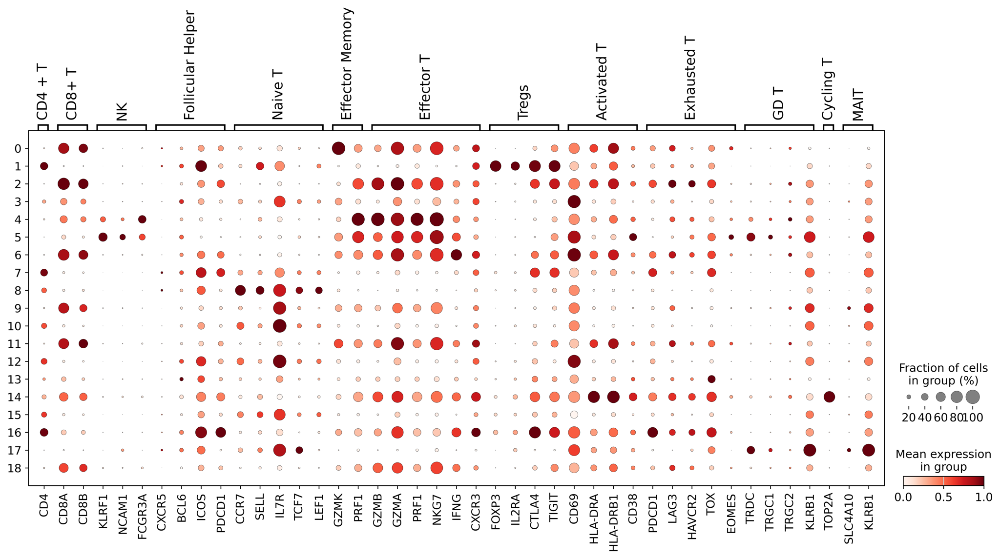

In [158]:

sc.settings.set_figure_params(dpi=300, dpi_save=300, figsize=(15,5), facecolor='white')

marker_dict = {
    'CD4 + T': ['CD4'],
    'CD8+ T': ['CD8A', 'CD8B'],
    'NK': ['KLRF1', 'NCAM1', 'FCGR3A'], #NCAM1 = CD56, FCGR3A = CD16
    'Follicular Helper': ['CXCR5', 'BCL6', 'ICOS', 'PDCD1'],
    'Naive T': ['CCR7', 'SELL',  'IL7R', 'TCF7', 'LEF1'],
    'Effector Memory': ['GZMK', 'PRF1'],
    'Effector T': [ 'GZMB', 'GZMA', 'PRF1', 'NKG7', 'IFNG', 'CXCR3'],
    'Tregs': ['FOXP3', 'IL2RA', 'CTLA4', 'TIGIT'],
    'Activated T' : ['CD69', 'HLA-DRA', 'HLA-DRB1', 'CD38'],
    'Exhausted T' : ['PDCD1', 'LAG3', 'HAVCR2', 'TOX', 'EOMES'],
    'GD T': ['TRDC', 'TRGC1', 'TRGC2', 'KLRB1'],
    'Cycling T': ['TOP2A'],
    'MAIT': ['SLC4A10', 'KLRB1']
}


sc.pl.dotplot(
    adata, marker_dict, 'leiden',
    standard_scale='var', swap_axes=False
)

#sc.pl.dotplot(adata, marker_dict, groupby='leiden', figsize=(12,6), standard_scale='var',  dendrogram=True, save='markers.pdf')

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


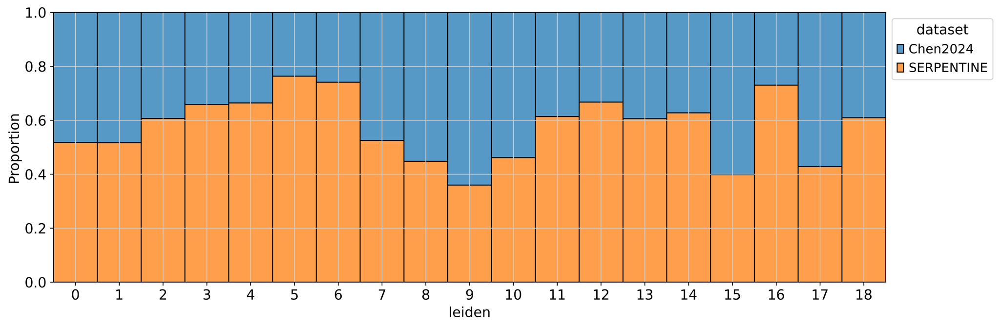

In [154]:
# stacked bar chart
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(15,5), facecolor='white')
ax = sns.histplot(
    data = adata.obs,
    x = 'leiden',
    hue = 'dataset',
    multiple='fill', stat='proportion',
    discrete=True
)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

In [124]:
adata.obs.dataset.value_counts()

dataset
SERPENTINE    171555
Chen2024      124193
Name: count, dtype: int64

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

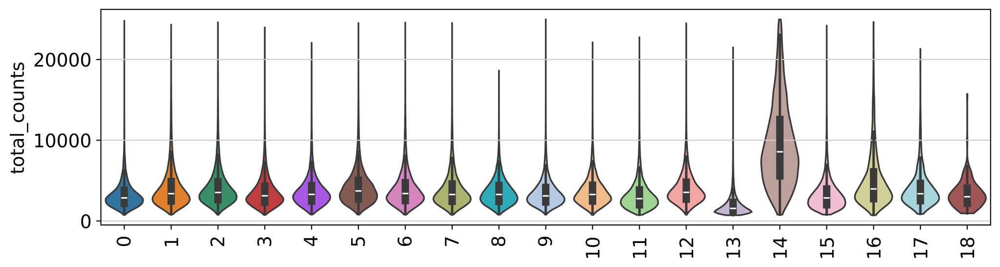

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

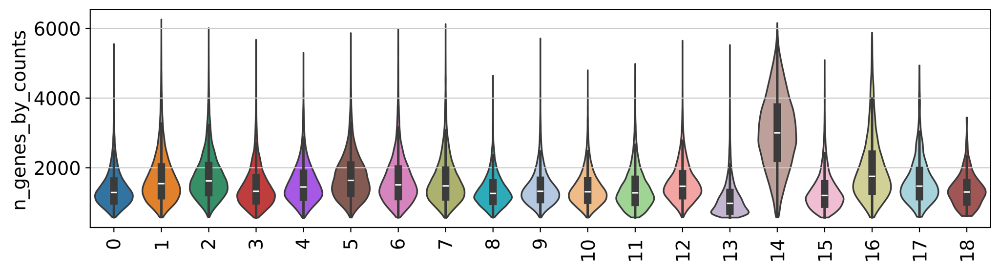

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

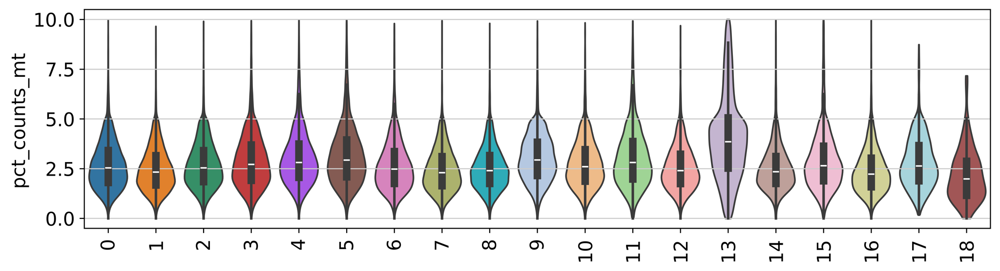

In [125]:
sc.settings.set_figure_params(dpi=400, dpi_save=400, figsize=(10,3), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=90)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=90)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=90)

In [126]:
adata.obs.leiden.value_counts()

leiden
0     31178
1     26861
2     24734
3     22481
4     22130
5     18489
6     18019
7     17718
8     16901
9     15299
10    15204
11    14058
12    13415
13    12123
14     9842
15     9611
16     6442
17     1074
18      169
Name: count, dtype: int64

## Marker genes

In [127]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method="wilcoxon")


In [128]:
group_key='leiden'

# get marker genes and add percent expressed
marker_genes_df = sc.get.rank_genes_groups_df(adata, group=None)
markers = append_percent_expressed(adata, marker_genes_df, group_key, 0.5) 


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18


In [129]:
markers.to_csv(
    "{}markers/integrated_{}_subcluster_{}_markers.csv".format(data_dir, cur_name, 'leiden1'),
    index=False
)


# set the thresholds for plotting
p_thresh = 0.05 
lfc_thresh = 1.0
pct_in_thresh = 10

# Subset for p-value, log fold change, and percentage expression thresholds
filtered_markers = markers[
    (markers["pvals_adj"] <= p_thresh) &
    (markers["logfoldchanges"] >= lfc_thresh) &
    (markers["pct_in_group"] >= pct_in_thresh)
]

filtered_markers.to_csv(
    "{}markers/integrated_{}_subcluster_{}_markers_signif.csv".format(data_dir, cur_name, 'leiden1'),
    index=False
)



In [19]:
%%bash 

pwd

/home/groups/singlecell/smorabito/analysis/SERPENTINE


/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


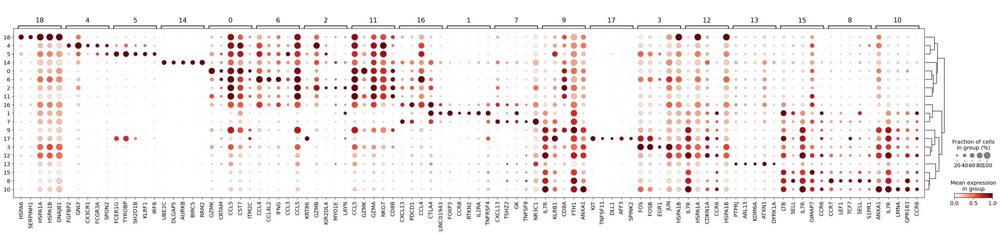

In [142]:
sc.settings.set_figure_params(dpi=100, dpi_save=500, figsize=(5,3), facecolor='white')

#-----------------------------------------------------------#
# make dotplots of the top 5 marker genes per cluster
#-----------------------------------------------------------#

cur_cluster = 'leiden_1.5'

# set the thresholds for plotting
p_thresh = 0.05 
lfc_thresh = 1.0
pct_in_thresh = 25
top_n = 5

# get the full list of marker genes
markers = pd.read_csv(
    "{}markers/integrated_{}_subcluster_{}_markers.csv".format(data_dir, cur_name, 'leiden1')
)
markers.group = markers.group.astype(str).astype('category')
markers.group = markers.group.cat.reorder_categories(adata.obs[cur_cluster].cat.categories.to_list(), ordered=True)

# Subset for p-value, log fold change, and percentage expression thresholds
filtered_markers = markers[
    (markers["pvals_adj"] < p_thresh) &
    (markers["logfoldchanges"] > lfc_thresh) &
    (markers["pct_in_group"] > pct_in_thresh)
]

# Get the top N markers per group
top_markers = (
    filtered_markers
    .groupby("group")
    .apply(lambda x: x.sort_values(by="logfoldchanges", ascending=False).head(top_n))
)
top_markers = top_markers.reset_index(drop=True)

# calculate marker genes for each of these clusters
features = top_markers.groupby("group")["names"].apply(list).to_dict()

sc.pl.dotplot(
    adata, features, 'leiden',
    standard_scale='var', swap_axes=False,
    dendrogram=True,
    save = '{}_integrated_subcluster_leiden_top5markers.pdf'.format(cur_name)
)


## Enrichment analysis

In [133]:
import gseapy as gp

In [140]:

cell_clusters = adata.obs['leiden'].cat.categories.to_list()

# thresholds
p_thresh = 0.05 
lfc_thresh = 1.0
pct_in_thresh = 10 

# enrichR dbs:
dbs = ['GO_Biological_Process_2021']

# get the full list of marker genes
markers = updated_marker_genes_df.copy()


df_list = []
for cur_group in cell_clusters:

    print(cur_group)
    
    # Subset for p-value, log fold change, and percentage expression thresholds
    filtered_markers = markers[
        (markers["group"] == cur_group) &
        (markers["pvals_adj"] < p_thresh) &
        (markers["logfoldchanges"] > lfc_thresh) &
        (markers["pct_in_group"] > pct_in_thresh)
    ]

    # don't run the enrichment if we don't have any genes
    if filtered_markers.shape[0] == 0:
        continue
    
    # run enrichr for this cluster:
    cur_enr_res = gp.enrichr(
        gene_list=filtered_markers.names.to_list(), 
        organism='Human', 
        gene_sets=dbs, 
        cutoff = 0.5
    )
    cur_df = cur_enr_res.results.copy()
    cur_df['group'] = cur_group 
    df_list.append(cur_df)

# append results
enrichr_df = pd.concat(df_list)

# save the table
enrichr_df.to_csv(
    "{}markers/integrated_{}_subcluster_{}_EnrichR.csv".format(data_dir, cur_name, 'leiden1'),
    index=False
)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18


In [ ]:
#

# select cluster
cur_group = '0'

# only get significant results
filtered_markers = markers[(markers["pvals_adj"] < 0.05)]

# sort by effect size
cur_markers = filtered_markers[filtered_markers.group == cur_group].sort_values(by=['logfoldchanges'], ascending=False)[['names', 'logfoldchanges']]

# run GSEA for this cluster
cur_res = gp.prerank(rnk=cur_markers, gene_sets='GO_Biological_Process_2021')

cur_res.res2d.head()


## Look at CellTypist annotations

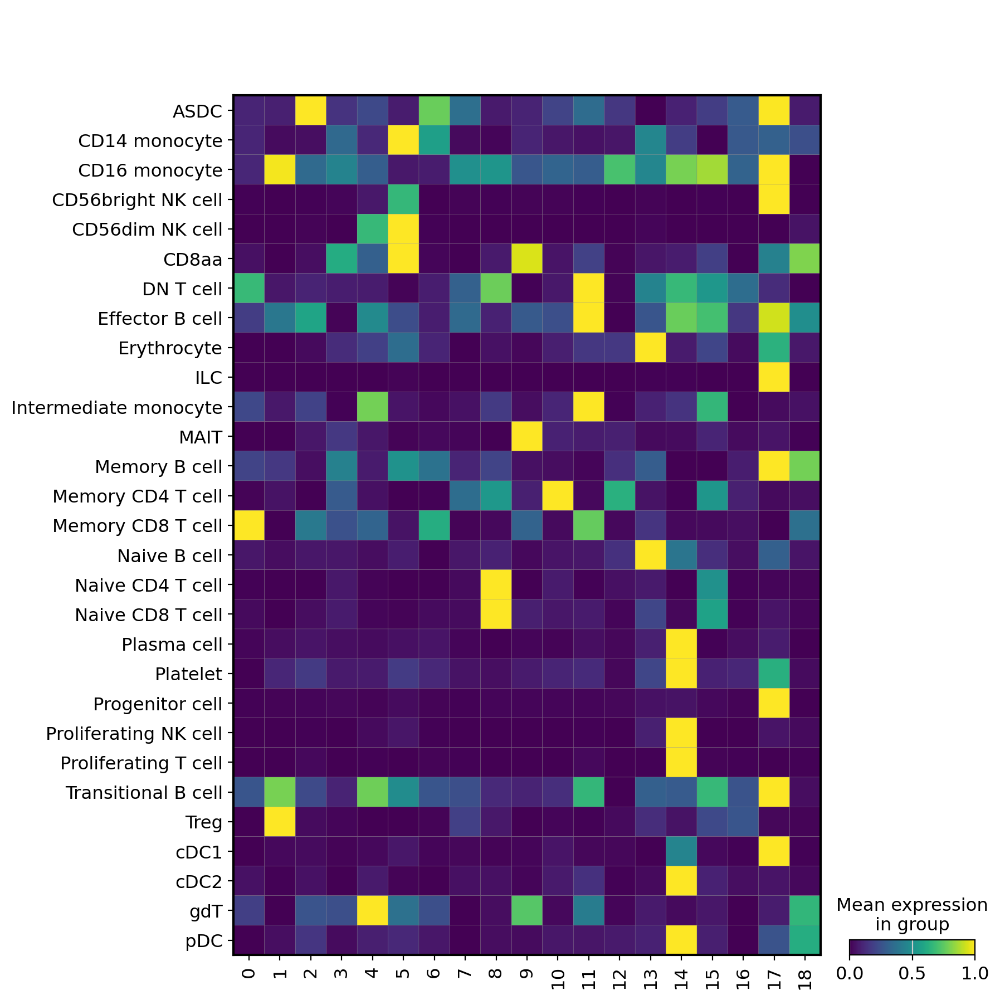

In [147]:
model_name = 'AIFI_L2'

old_obs = adata.obs.copy()

# add the predicted probs
probs = adata.obsm[model_name] 
feats = probs.columns.to_list()
new_obs = pd.concat([adata.obs, probs], axis=1)
adata.obs = new_obs 

sc.pl.matrixplot(
    adata, var_names=feats, groupby='leiden',
    standard_scale='var', swap_axes=True,
    save = '{}_predicted_labels.pdf'.format(model_name)
)

# reset the obs
adata.obs = old_obs

/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


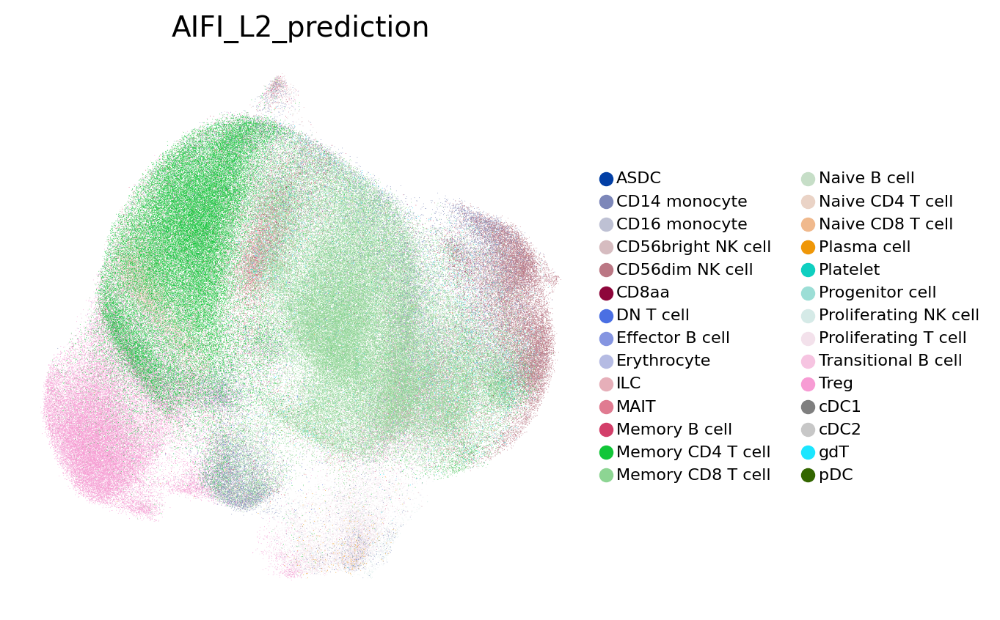

In [79]:
sc.settings.set_figure_params(dpi=100, dpi_save=500, figsize=(5,5), facecolor='white')

sc.pl.embedding(
    adata,
    basis = 'X_umap_harmony',
    color = ['AIFI_L2_prediction'],
   # legend_loc='on data', 
    legend_fontsize=8, 
    frameon = False,
)

## Annotate

In [102]:
leiden_df = pd.read_table(
    "{}integrated_leiden15_annotations.csv".format(data_dir), sep=',',
)
leiden_df.leiden = leiden_df.leiden.astype(str).astype('category')

In [103]:
adata.obs = adata.obs.drop(['lv1', 'lv2'], axis=1)

In [104]:
# merge with anndata obs
temp = adata.obs.merge(leiden_df, how='left', left_on='leiden_1.5', right_on='leiden')

In [105]:
# add the annotations
adata.obs['lv1'] = temp.lv1.to_list() 
adata.obs['lv2'] = temp.lv2.to_list()

In [106]:
# remove the LQ clusters
adata = adata[adata.obs.lv2 != 'LQ'].copy()

... storing 'lv1' as categorical
... storing 'lv2' as categorical
/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


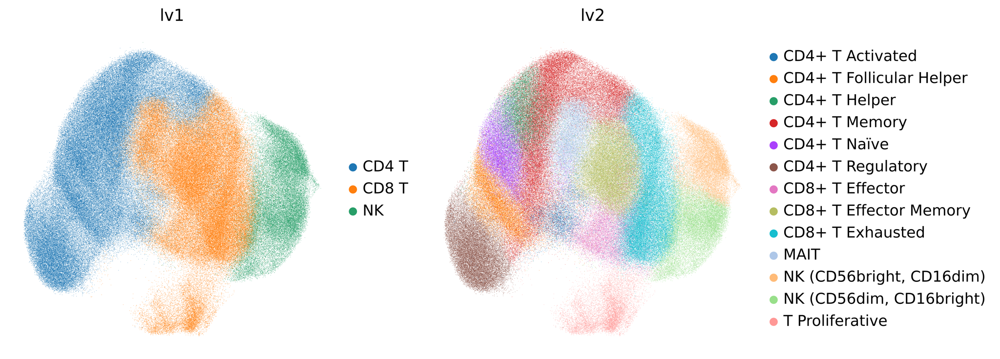

In [107]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(5,5), facecolor='white')

sc.pl.umap(
    adata,
    color = ['lv1', 'lv2'],
    frameon = False,
#save = '_initial_annotation.pdf'

)

/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


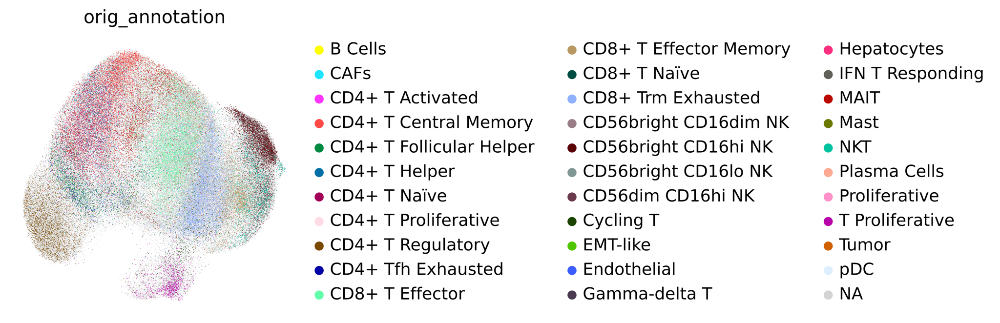

In [95]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(4,4), facecolor='white')

sc.pl.umap(
    adata[adata.obs.dataset == 'SERPENTINE'],
    color = ['orig_annotation'],
    frameon = False,
#save = '_initial_annotation.pdf'

)

/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
... storing 'orig_annotation' as categorical
/home/groups/singlecell/smorabito/.conda/envs/scanpy-081124/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


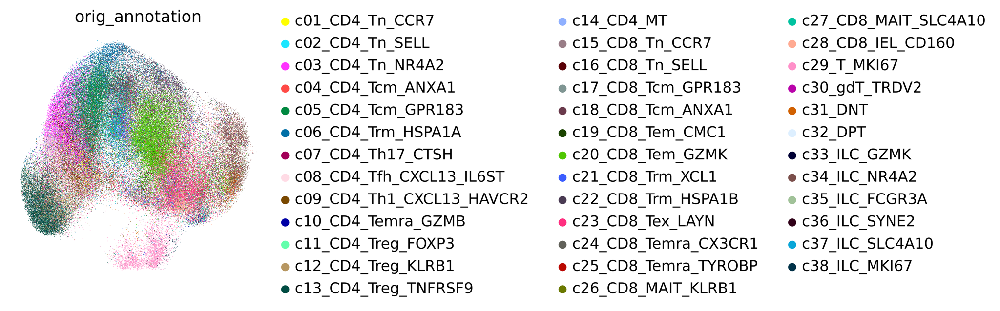

In [45]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(4,4), facecolor='white')

sc.pl.umap(
    adata[adata.obs.dataset != 'SERPENTINE'],
    color = ['orig_annotation'],
    frameon = False,
#save = '_initial_annotation.pdf'

)

leiden_1.5,0,1,2,3,4,5,6,7,8,9,10,11,12,14,15,16
orig_annotation,,,,,,,,,,,,,,,,
B Cells,0.000449,0.001058,0.000664,0.000548,0.000628,0.000461,0.001609,0.000421,0.000000,0.000000,0.000386,0.000514,0.000000,0.000000,0.001100,0.000000
CAFs,0.000000,0.000353,0.000000,0.000183,0.000000,0.000154,0.000000,0.000000,0.000000,0.000420,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD4+ T Activated,0.002020,0.000705,0.001106,0.010405,0.002303,0.004147,0.006166,0.001262,0.005812,0.014694,0.004630,0.003086,0.007082,0.000559,0.002200,0.006416
CD4+ T Central Memory,0.005836,0.014109,0.000000,0.401789,0.002093,0.000307,0.009920,0.043734,0.357613,0.047859,0.437886,0.018004,0.285765,0.001119,0.254125,0.055912
CD4+ T Follicular Helper,0.019529,0.017989,0.009294,0.018437,0.002093,0.000000,0.013137,0.419680,0.011623,0.003778,0.025077,0.032922,0.034348,0.008949,0.052805,0.353804


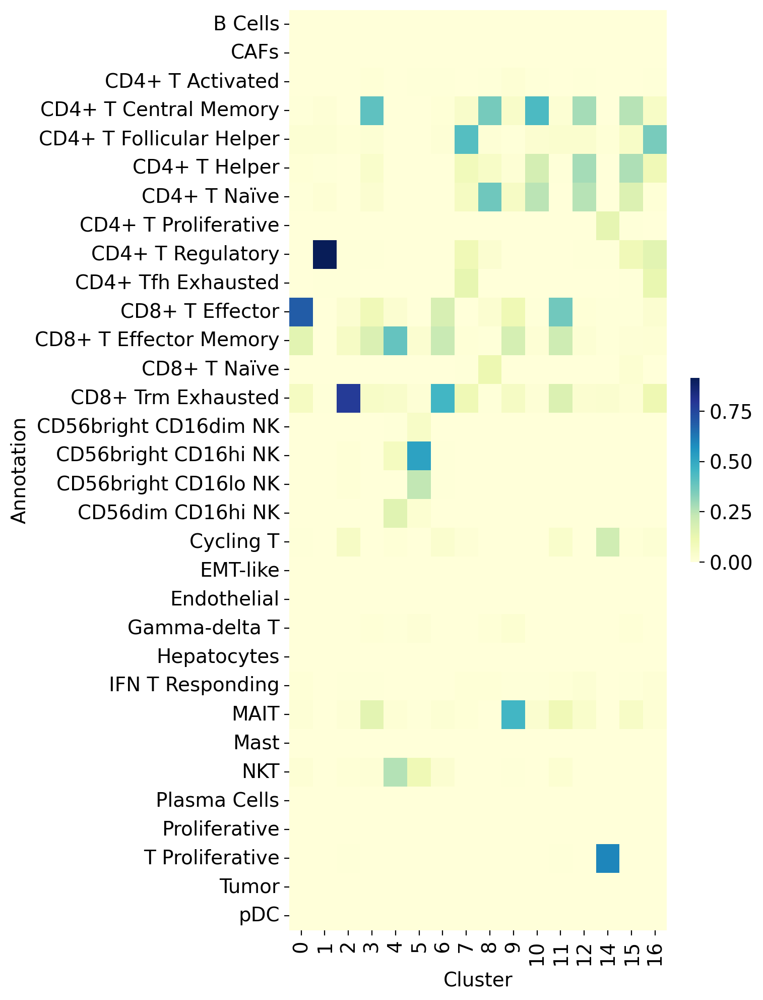

In [110]:
sc.settings.set_figure_params(dpi=100, dpi_save=500, figsize=(6,6), facecolor='white')

df = adata.obs[adata.obs.dataset == 'SERPENTINE']
sample_cluster_table = pd.crosstab(df['orig_annotation'], df['leiden_1.5'])
normalized_table = sample_cluster_table.div(sample_cluster_table.sum(axis=0), axis=1)
normalized_table.head()

# Plot the normalized table as a heatmap
plt.figure(figsize=(6, 12))
sns.heatmap(
    normalized_table, 
    annot=False, cmap="YlGnBu", 
    cbar=True, fmt=".2f", cbar_kws={"shrink": 0.2}
)
plt.xlabel("Cluster")
plt.ylabel("Annotation")
plt.grid(None)
plt.show()

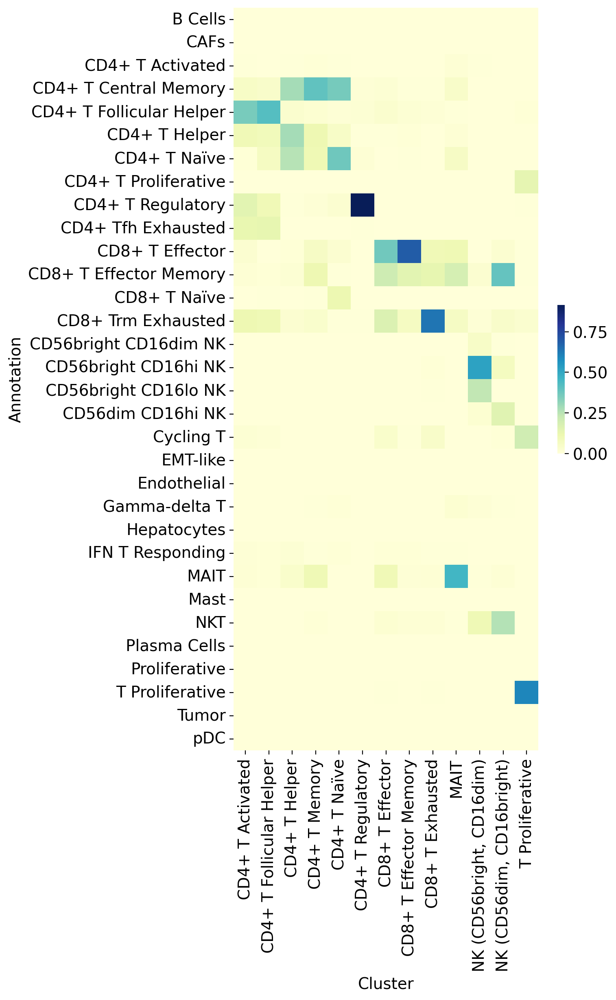

In [112]:
sc.settings.set_figure_params(dpi=100, dpi_save=500, figsize=(6,6), facecolor='white')

df = adata.obs[adata.obs.dataset == 'SERPENTINE']
sample_cluster_table = pd.crosstab(df['orig_annotation'], df['lv2'])
normalized_table = sample_cluster_table.div(sample_cluster_table.sum(axis=0), axis=1)
normalized_table.head()

# Plot the normalized table as a heatmap
plt.figure(figsize=(6, 12))
sns.heatmap(
    normalized_table, 
    annot=False, cmap="YlGnBu", 
    cbar=True, fmt=".2f", cbar_kws={"shrink": 0.2}
)
plt.xlabel("Cluster")
plt.ylabel("Annotation")
plt.grid(None)
plt.show()

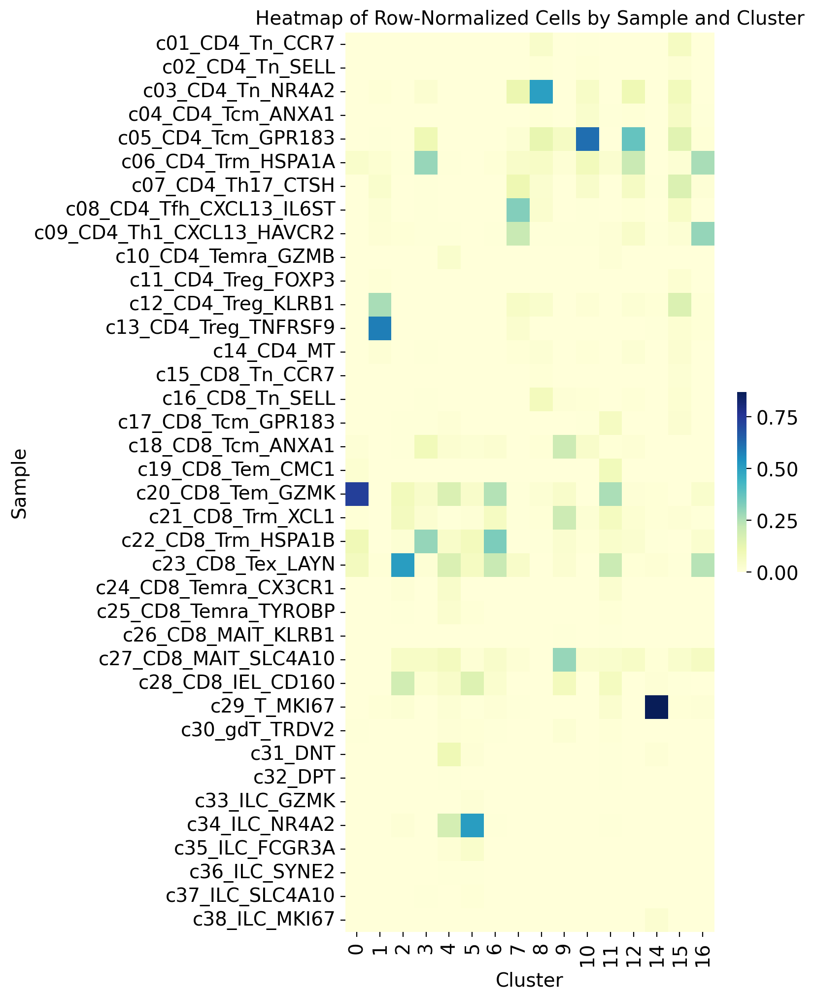

In [89]:
sc.settings.set_figure_params(dpi=100, dpi_save=500, figsize=(6,6), facecolor='white')

df = adata.obs[adata.obs.dataset != 'SERPENTINE']
sample_cluster_table = pd.crosstab(df['orig_annotation'], df['leiden_1.5'])
normalized_table = sample_cluster_table.div(sample_cluster_table.sum(axis=0), axis=1)
normalized_table.head()

# Plot the normalized table as a heatmap
plt.figure(figsize=(6, 12))
sns.heatmap(
    normalized_table, 
    annot=False, cmap="YlGnBu", 
    cbar=True, fmt=".2f", cbar_kws={"shrink": 0.2}
)
plt.title("Heatmap of Row-Normalized Cells by Sample and Cluster")
plt.xlabel("Cluster")
plt.ylabel("Sample")
plt.grid(None)
plt.show()

In [83]:
adata.obs[(adata.obs.dataset == 'SERPENTINE') & (adata.obs['leiden_1.5'] == '2')].orig_annotation.value_counts()


orig_annotation
CD8+ Trm Exhausted        3529
Cycling T                  268
CD8+ T Effector Memory     263
CD8+ T Effector            121
MAIT                        50
                          ... 
c10_CD4_Temra_GZMB           0
c11_CD4_Treg_FOXP3           0
c12_CD4_Treg_KLRB1           0
c13_CD4_Treg_TNFRSF9         0
c05_CD4_Tcm_GPR183           0
Name: count, Length: 70, dtype: int64

## Save the results

In [46]:
# save the results
adata.write('{}Integrated_{}_harmony_03-12-24_processed.h5ad'.format(data_dir, cur_name))

... storing 'orig_annotation' as categorical


In [47]:
adata.obs[adata.obs.dataset == 'SERPENTINE'].orig_annotation.value_counts()

orig_annotation
CD8+ Trm Exhausted        7164
CD8+ T Effector Memory    5755
CD4+ T Central Memory     5728
CD8+ T Effector           5663
CD56bright CD16hi NK      3829
                          ... 
c15_CD8_Tn_CCR7              0
c16_CD8_Tn_SELL              0
c17_CD8_Tcm_GPR183           0
c18_CD8_Tcm_ANXA1            0
c05_CD4_Tcm_GPR183           0
Name: count, Length: 70, dtype: int64